# Construct New Roads

# Strategy-1

In [ ]:
dist1 = {}

for edge in gdel_prune.edges():
  long1 = gdel_prune.nodes[edge[0]]["centroid"][0]
  lat1 = gdel_prune.nodes[edge[0]]["centroid"][1]
  long2 = gdel_prune.nodes[edge[1]]["centroid"][0]
  lat2 = gdel_prune.nodes[edge[1]]["centroid"][1]
  dist1[edge] = np.sqrt( (long1 - long2)**2 + (lat1 - lat2)**2 )*69 #from the qn


In [ ]:
nx.set_edge_attributes(gdel_prune, values = dist1, name = "edge_distance")

In [ ]:
gdel_prune.number_of_nodes(), gdel_prune.number_of_edges()
gdel_prune.remove_nodes_from(list(nx.isolates(gdel_prune)))
gdel_prune = nx.convert_node_labels_to_integers(gdel_prune)

(2649, 7862)

In [ ]:
path_lengths = nx.all_pairs_dijkstra_path_length(gdel_prune, weight = "edge_distance"))

In [ ]:
#Shortest paths matrix
shortest_paths = np.zeros(shape = (len(path_lengths), len(path_lengths)))
for row in path_lengths.keys():
  for column in path_lengths[row].keys():
    shortest_paths[row][column] = path_lengths[row][column]

In [ ]:
# Create a euclidean distance matrix 
euclidean_distances = np.zeros(shape = (len(path_lengths), len(path_lengths)))
count = 1
for row in path_lengths.keys():
  centroid1 = gdel_prune.nodes[row]["centroid"]
  long1 = centroid1[0]
  lat1 = centroid1[1]
  for column in path_lengths[row].keys():
    centroid2 = gdel_prune.nodes[column]["centroid"]
    long2 = centroid2[0]
    lat2 = centroid2[1]
    euclidean_distances[row][column] = np.sqrt( (long1 - long2)**2 + (lat1 - lat2)**2 )*69


In [ ]:
# Find extra distance 
extra_distance = shortest_paths - euclidean_distances
# Get indices of 40  elements with largest value (as A->B and B-> A considered as different pathd)
edge1, edge2 = np.unravel_index(np.argpartition(extra_distance.flatten(), -40)[-40:] ,extra_distance.shape)
gdel_prune_strat1 = gdel_prune.copy()
for i, j in zip(edge1 ,edge2):
  if gdel_prune_strat1.has_edge(i, j):
    continue
  else:
    gdel_prune_strat1.add_edge(i, j)

[41, 2419]
[44, 2419]
[48, 2419]
[146, 1783]
[393, 2419]
[968, 1510]
[988, 1510]
[988, 1678]
[1005, 1510]
[1005, 1678]
[1005, 1511]
[1699, 1783]
[1699, 1860]
[1782, 2416]
[1783, 2413]
[1783, 2416]
[1859, 2416]
[1860, 2413]
[1860, 2416]
[2159, 2419]


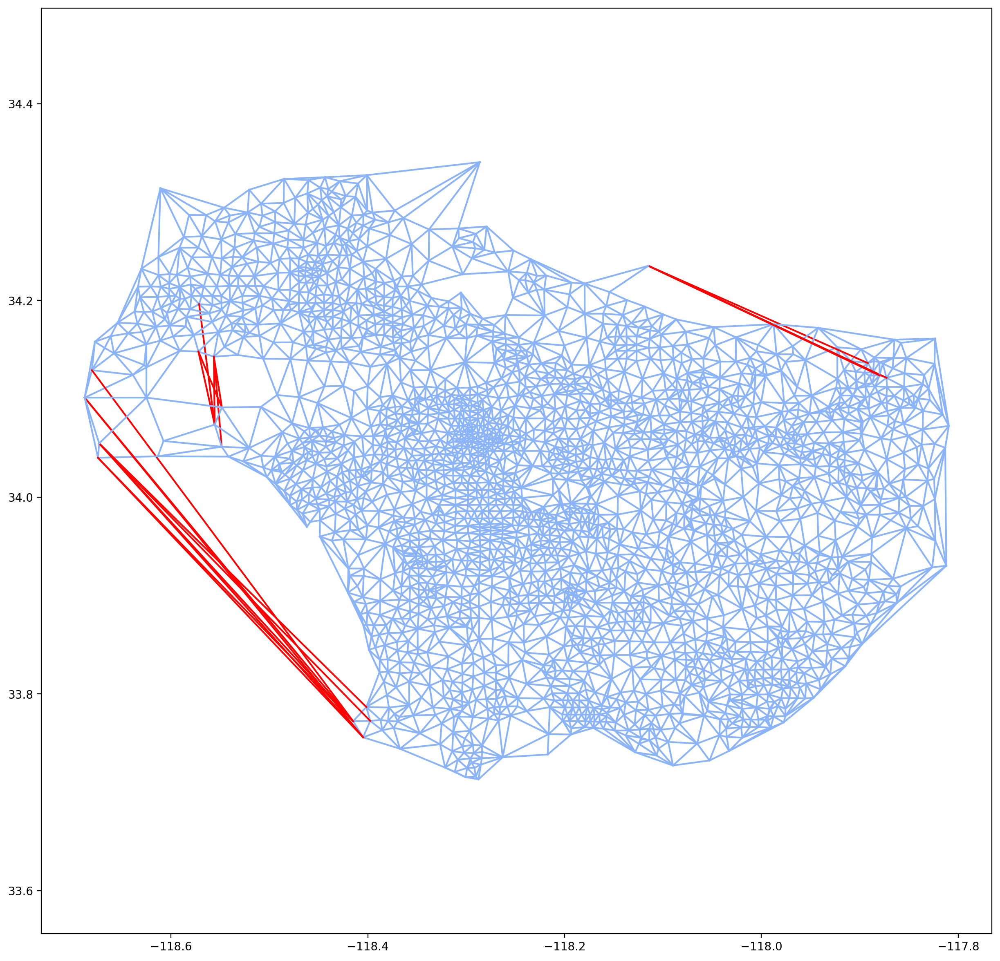

In [ ]:
# plot the roads and highlight our new edges. 
plt.figure(figsize=(15,15), dpi=200)
for edge in gdel_prune_strat1.edges():
    start = edge[0]
    end = edge[1]
    cur_edge = sorted([start,end])
    v1 = gdel_prune.nodes[cur_edge[0]]['centroid']
    v2 = gdel_prune.nodes[cur_edge[1]]['centroid']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if not gdel_prune.has_edge(cur_edge[0], cur_edge[1]):
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
 
plt.axis('equal')
plt.show()

# Strategy-2

In [ ]:
# Create a random frequency matrix 
rand_int = np.random.randint(1, 1000, extra_distance.shape)
weights = np.tril(rand_int) + np.tril(rand_int, -1).T

distances = np.multiply(weights, extra_distance)
e1, e2 = np.unravel_index(np.argpartition(distances.flatten(), -40)[-40:] ,distances.shape)
gdel_prune_strat2 = gdel_prune.copy()
for i, j in zip(e1 ,e2):
  if gdel_prune_strat2.has_edge(i, j):
    continue
  else:
    gdel_prune_strat2.add_edge(i, j)

[41, 2419]
[223, 2419]
[225, 2420]
[285, 2419]
[381, 2420]
[382, 2420]
[952, 1510]
[954, 1678]
[968, 1678]
[969, 1678]
[971, 1678]
[988, 1510]
[1699, 1860]
[1783, 2413]
[1854, 2419]
[2149, 2419]
[2155, 2419]
[2158, 2419]
[2419, 2599]
[2419, 2420]


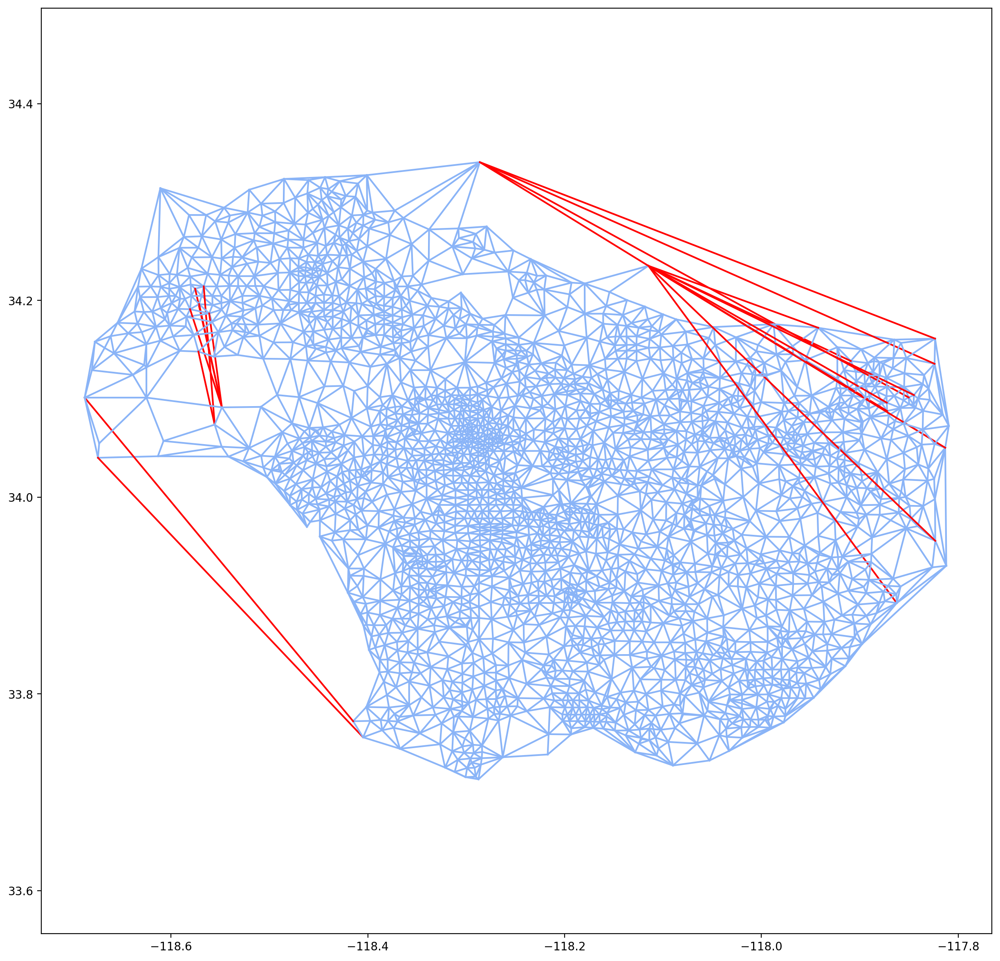

In [ ]:
# plot the roads and highlight our new edges. 
plt.figure(figsize=(15,15), dpi=200)
for edge in gdel_prune_strat2.edges():
    start = edge[0]
    end = edge[1]
    cur_edge = sorted([start,end])

    v1 = gdel_prune.nodes[cur_edge[0]]['centroid']
    v2 = gdel_prune.nodes[cur_edge[1]]['centroid']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if not gdel_prune.has_edge(cur_edge[0], cur_edge[1]):
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
    
# mark the source and destination
# source = tri_g.vs.select(display_name=source_address)[0].index
# target = tri_g.vs.select(display_name=dest_address)[0].index
# v1 = road_map_static.vs[source_idx]['coordinates']
# v2 = road_map_static.vs[dest_idx]['coordinates']
# data = np.vstack([v1, v2])
# x = data[:, 0]
# y = data[:, 1]
# plt.plot(x, y, 'bo')



plt.axis('equal')
plt.show()

# Strategy-3

In [ ]:
g_strategy3 = gdel_prune.copy()

# Loop through 20 times
for i in range(20):

  # Create a shortest path matrix
  dj_length = dict(nx.all_pairs_dijkstra_path_length(g_strategy3, weight = "edge_distance"))
  shortest_path = np.zeros(shape = (len(dj_length), len(dj_length)))

  for row in dj_length.keys():
    for column in dj_length[row].keys():
      shortest_path[row][column] = dj_length[row][column]

  # Difference between the two matrices gives distance 
  dist_matrix_strat3 = shortest_path - euc_dist_matrix


  # Get index of index with largest value
  edge1, edge2 = np.unravel_index(np.argmax(dist_matrix_strat3.flatten()) ,dist_matrix_strat3.shape)
 
  g_strategy3.add_edge(edge1, edge2, edge_distance = euc_dist_matrix[edge1][edge2])

[44, 2419]
[120, 688]
[120, 1679]
[144, 2565]
[285, 2419]
[356, 1679]
[382, 2420]
[657, 1679]
[1005, 1510]
[1672, 2627]
[1672, 2376]
[1700, 1783]
[1717, 2419]
[1783, 2416]
[1875, 2416]
[1956, 2419]
[2239, 2419]
[2247, 2420]
[2419, 2420]
[2420, 2461]


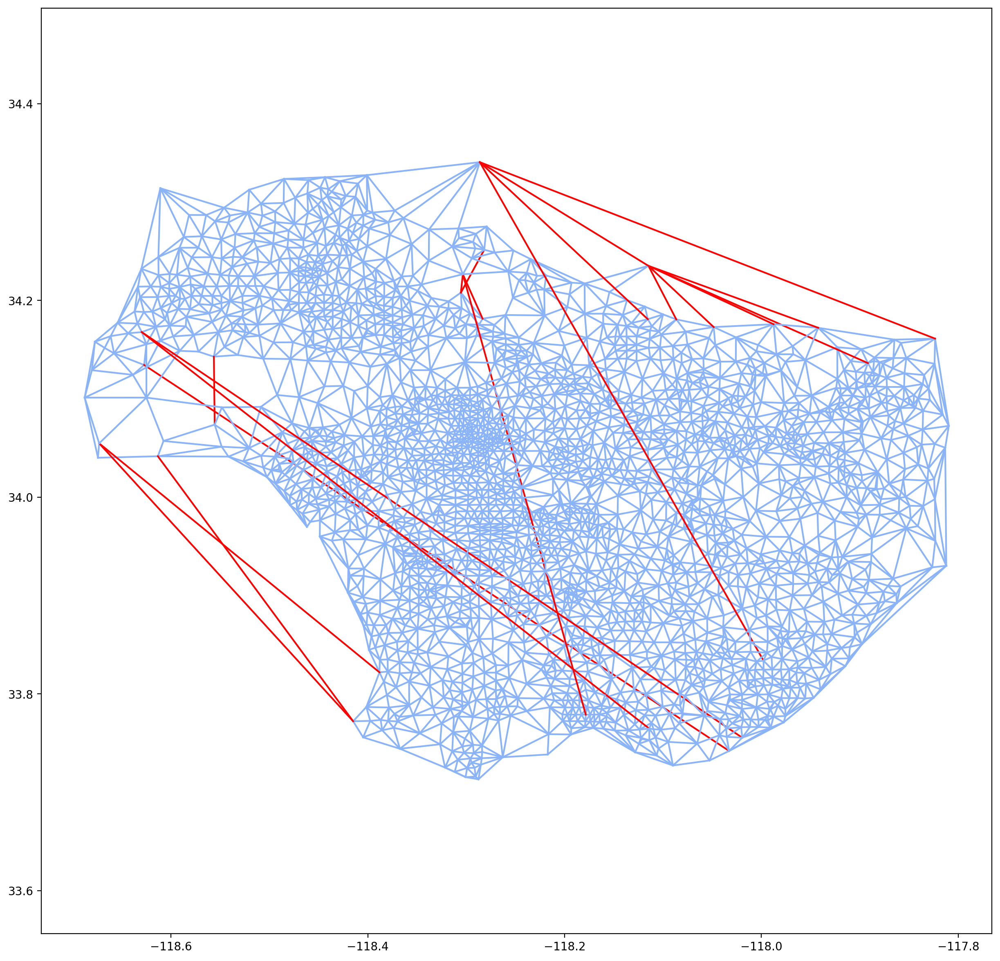

In [ ]:
# plot the roads and highlight our new edges. 
plt.figure(figsize=(15,15), dpi=200)
for edge in g_strategy3.edges():
    start = edge[0]
    end = edge[1]
    cur_edge = sorted([start,end])

    v1 = g_strategy3.nodes[cur_edge[0]]['centroid']
    v2 = g_strategy3.nodes[cur_edge[1]]['centroid']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if not gdel_prune.has_edge(cur_edge[0], cur_edge[1]):
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
    
# mark the source and destination
# source = tri_g.vs.select(display_name=source_address)[0].index
# target = tri_g.vs.select(display_name=dest_address)[0].index
# v1 = road_map_static.vs[source_idx]['coordinates']
# v2 = road_map_static.vs[dest_idx]['coordinates']
# data = np.vstack([v1, v2])
# x = data[:, 0]
# y = data[:, 1]
# plt.plot(x, y, 'bo')



plt.axis('equal')
plt.show()

# Strategy-4

In [ ]:
g_strategy4 = gdel_prune.copy()
djk_length = dict(nx.all_pairs_dijkstra_path_length(g_strategy4, weight = "weight"))

In [ ]:
# Create a matrix that calculates the shortest travel time between two points
# we calculate the shortest travel time here

short_travel_speed= np.zeros(shape = shorted_path_matrix.shape)
travel_time_matrix =  np.zeros(shape = shorted_path_matrix.shape)
euc_time = np.zeros(shape = shorted_path_matrix.shape)
for row in range(shorted_path_matrix.shape[0]):
  for column in range(shorted_path_matrix.shape[1]):

    if shorted_path_matrix[row][column] != 0:

      # Shortest time is in miles and travel time is in seconds. 
      travel_time_matrix[row][column] = djk_length[row][column]
      short_travel_speed[row][column] = shorted_path_matrix[row][column]/travel_time_matrix[row][column]
      euc_time[row][column] = euc_dist_matrix[row][column]/short_travel_speed[row][column]



In [ ]:
# Calculate extra time 

time = travel_time_matrix - euc_time 

# Get indices of 40  elements with largest value
edge1, edge2 = np.unravel_index(np.argpartition(time.flatten(), -40)[-40:] ,time.shape)
for i, j in zip(edge1 ,edge2):

  if g_strategy4.has_edge(i, j):
    continue
  else:
    g_strategy4.add_edge(i, j, weight = euc_time[i][j], edge_distance = euc_dist_matrix[i][j])


[47, 2419]
[385, 2419]
[389, 2419]
[393, 2419]
[1005, 1511]
[1699, 1860]
[1699, 1859]
[1699, 1783]
[1782, 2416]
[1783, 2413]
[1783, 2416]
[1857, 2416]
[1859, 2416]
[1860, 2416]
[1882, 2416]
[2049, 2419]
[2144, 2419]
[2159, 2419]
[2162, 2419]
[2163, 2419]


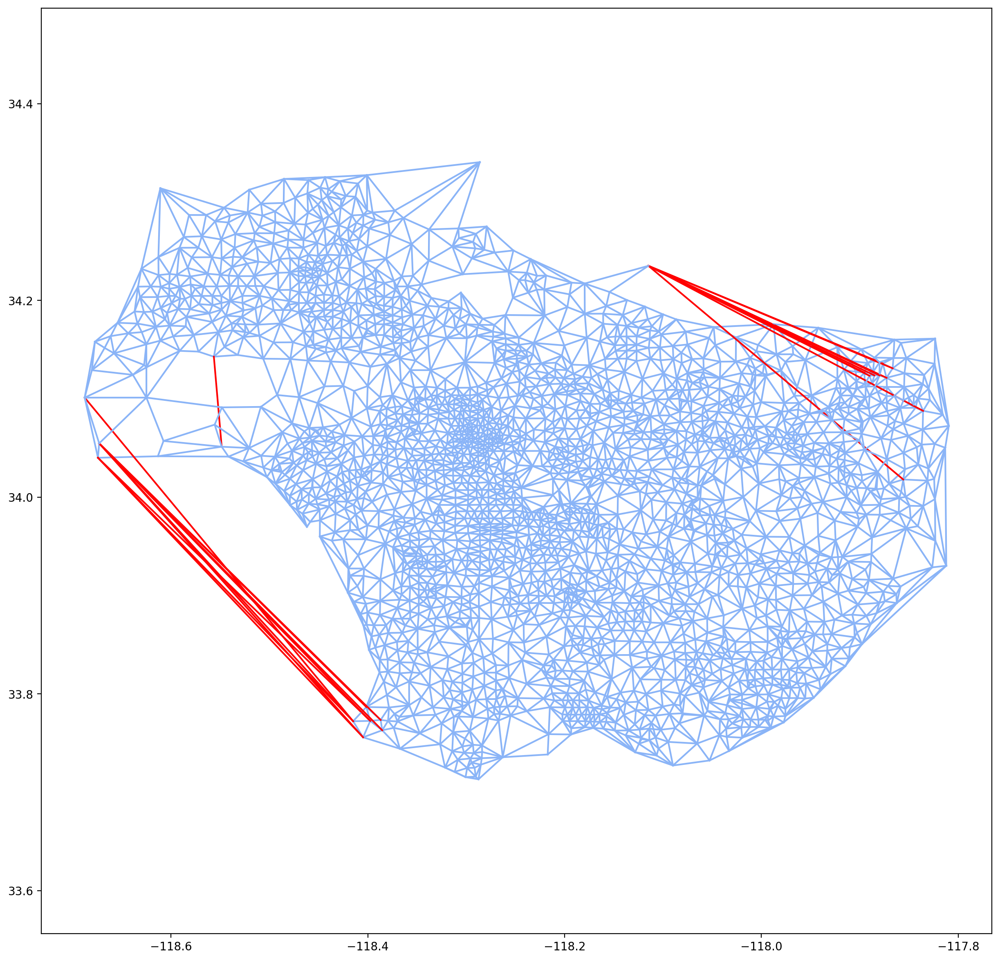

In [ ]:
# plot the roads and highlight our new edges. 
plt.figure(figsize=(15,15), dpi=200)
for edge in g_strategy4.edges():
    start = edge[0]
    end = edge[1]
    cur_edge = sorted([start,end])

    v1 = g_strategy4.nodes[cur_edge[0]]['centroid']
    v2 = g_strategy4.nodes[cur_edge[1]]['centroid']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if not gdel_prune.has_edge(cur_edge[0], cur_edge[1]):
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
    
# mark the source and destination
# source = tri_g.vs.select(display_name=source_address)[0].index
# target = tri_g.vs.select(display_name=dest_address)[0].index
# v1 = road_map_static.vs[source_idx]['coordinates']
# v2 = road_map_static.vs[dest_idx]['coordinates']
# data = np.vstack([v1, v2])
# x = data[:, 0]
# y = data[:, 1]
# plt.plot(x, y, 'bo')



plt.axis('equal')
plt.show()

# Strategy-5

In [ ]:
g_strategy5 = gdel_prune.copy()

# create one by one
for _ in range(20):
  # Create a shortest path matrix
  djk_length_strat5 = dict(nx.all_pairs_dijkstra_path_length(g_strategy5, weight = "weight"))
  path_strat5 = dict(nx.all_pairs_dijkstra_path_length(g_strategy5, weight = "edge_distance"))
  shorted_path_matrix_strat5 = np.zeros(shape = (len(path_strat5), len(path_strat5)))


  short_travel_speed_strat5 = np.zeros(shape = shorted_path_matrix.shape)
  travel_time_matrix_strat5=  np.zeros(shape = shorted_path_matrix.shape)
  euc_time_strat5 = np.zeros(shape = shorted_path_matrix.shape)

  for row in djk_length_strat5.keys():
    for column in djk_length_strat5[row].keys():

      if row!= column:
        shorted_path_matrix_strat5[row][column] = path_strat5[row][column]
        travel_time_matrix_strat5[row][column] = djk_length_strat5[row][column]
        short_travel_speed_strat5[row][column] = shorted_path_matrix_strat5[row][column]/travel_time_matrix_strat5[row][column]
        euc_time_strat5[row][column] = euc_dist_matrix[row][column]/short_travel_speed_strat5[row][column]

  # Difference between the two matrices gives distance 
  time_strat5 = travel_time_matrix_strat5 - euc_time_strat5 


  # Get index of index with largest value
  edge1, edge2 = np.unravel_index(np.argmax(time_strat5.flatten()) ,time_strat5.shape)
  print(edge1, edge2)
  g_strategy5.add_edge(edge1, edge2, weight = euc_time_strat5[edge1][edge2], edge_distance = euc_dist_matrix[edge1][edge2])


1783 2416
2419 385
1005 1511
1700 1783
42 2419
1004 1678
120 1679
2579 2419
2186 2419
118 2419
311 2419
386 2420
47 2420
2232 2419
22 2419
285 2420
2420 512
2416 1875
555 2420
2420 2419


[22, 2419]
[42, 2419]
[47, 2420]
[118, 2419]
[120, 1679]
[285, 2420]
[311, 2419]
[385, 2419]
[386, 2420]
[512, 2420]
[555, 2420]
[1004, 1678]
[1005, 1511]
[1700, 1783]
[1783, 2416]
[1875, 2416]
[2186, 2419]
[2232, 2419]
[2419, 2579]
[2419, 2420]


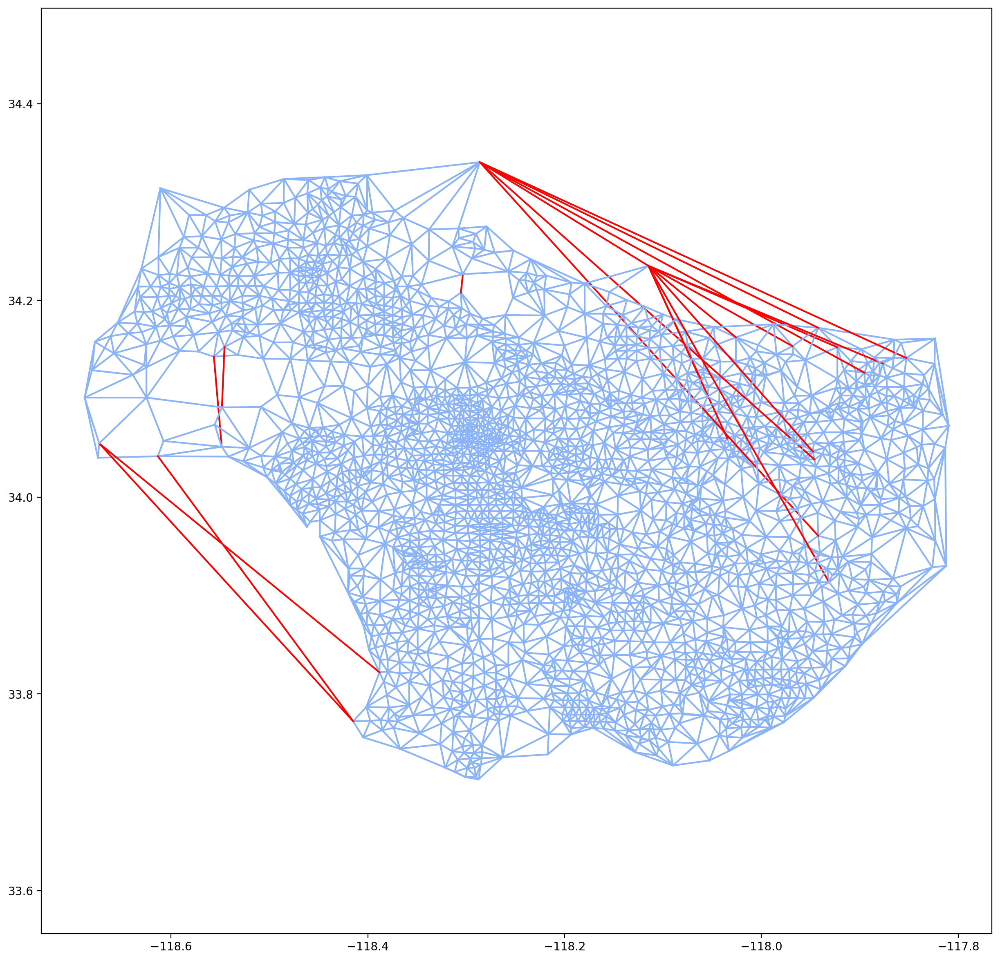

In [ ]:
# plot the roads and highlight our new edges. 
plt.figure(figsize=(15,15), dpi=200)
for edge in g_strategy5.edges():
    start = edge[0]
    end = edge[1]
    cur_edge = sorted([start,end])

    v1 = g_strategy5.nodes[cur_edge[0]]['centroid']
    v2 = g_strategy5.nodes[cur_edge[1]]['centroid']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if not gdel_prune.has_edge(cur_edge[0], cur_edge[1]):
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
    
# mark the source and destination
# source = tri_g.vs.select(display_name=source_address)[0].index
# target = tri_g.vs.select(display_name=dest_address)[0].index
# v1 = road_map_static.vs[source_idx]['coordinates']
# v2 = road_map_static.vs[dest_idx]['coordinates']
# data = np.vstack([v1, v2])
# x = data[:, 0]
# y = data[:, 1]
# plt.plot(x, y, 'bo')



plt.axis('equal')
plt.show()